In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import matplotlib.pyplot as plt
import matplotlib as mpl
from cycler import cycler
%config InlineBackend.figure_format = 'retina'
%matplotlib inline
import numpy as np
import scipy.stats as sps
import json, pickle, os, corner, glob
import enterprise.signals.utils as utils
from enterprise.pulsar import Pulsar
import arviz as az
from collections import defaultdict
import pandas as pd


import warnings
warnings.filterwarnings('ignore')

You'll need sksparse for get_coefficients() with common signals!


In [3]:
import la_forge.diagnostics as dg
import la_forge.core as co
from la_forge.rednoise import plot_rednoise_spectrum, plot_free_spec
from la_forge.utils import epoch_ave_resid

In [4]:
color_cycle_wong = ['#000000','#E69F00','#009E73','#56B4E9','#0072B2','#F0E442','#D55E00','#CC79A7']
mpl.rcParams['axes.prop_cycle'] = cycler(color=color_cycle_wong)

In [5]:
current_path = os.getcwd()
splt_path = current_path.split("/")
top_path_idx = splt_path.index("akaiser")
#top_path_idx = splt_path.index("nanograv")
top_dir = "/".join(splt_path[0 : top_path_idx + 1])

In [ ]:
e_e_path = top_dir + "/enterprise_extensions/"
sys.path.insert(0, e_e_path)
from enterprise_extensions.timing_2 import get_astrometric_priors
px_priors = get_astrometric_priors()
tm_val = float(px_priors[psrlist[0]]['PI'][0])
tm_sigma = 2.0*float(px_priors[psrlist[0]]['PI'][0])
tm_lower_bound = 3.0*float(px_priors[psrlist[0]]['eminus'][0])
tm_upper_bound = 3.0*float(px_priors[psrlist[0]]['eplus'][0])

In [6]:
psr_name = 'J2317+1439'#'J1640+2224'#'J2317+1439' 'J1909-3744'

psrlist = [psr_name]
datareleases = ['5yr','9yr','11yr']

datadir_list = []
parfiles = []
timfiles = []
for datarelease in datareleases:
    datadir = top_dir + '/{}'.format(datarelease)
    tmp_parfiles = sorted(glob.glob(datadir + '/par/*.par'))
    tmp_timfiles = sorted(glob.glob(datadir + '/tim/*.tim'))
    # filter
    parfiles = np.concatenate((parfiles,[x for x in tmp_parfiles if x.split('/')[-1].split('.')[0].split('_')[0] in psrlist]),axis=0)
    timfiles = np.concatenate((timfiles,[x for x in tmp_timfiles if x.split('/')[-1].split('.')[0].split('_')[0] in psrlist]),axis=0)

psrs = []
for p, t in zip(parfiles, timfiles):
    psr = Pulsar(p, t, ephem='DE436', clk=None, drop_t2pulsar=False)
    psrs.append(psr)
    
for psr in psrs:
    print(psr.name)
    
pardict = {}
for psr,dataset in zip(psrs,datareleases):
    pardict[dataset] = {}
    print(dataset)
    pardict[dataset][psr.name] = {}
    for par,vals,errs in zip(psr.fitpars[1:],psr.t2pulsar.vals(),psr.t2pulsar.errs()):
        if "DMX" in ["".join(list(x)[0:3]) for x in par.split("_")][0]:
            pass
        elif "FD" in ["".join(list(x)[0:2]) for x in par.split("_")][0]:
            pass
        elif "JUMP" in ["".join(list(x)[0:4]) for x in par.split("_")][0]:
            pass
        elif par in ["Offset","TASC"]:
            pass
        elif par in ["RAJ", "DECJ", "ELONG", "ELAT", "BETA", "LAMBDA"]:
            pass
        #elif par in ["PMRA", "PMDEC", "PMELONG", "PMELAT", "PMBETA", "PMLAMBDA"]:
        #    pass
        else:
            pardict[dataset][psr.name][par] = {}
            pardict[dataset][psr.name][par]['val'] = vals
            pardict[dataset][psr.name][par]['err'] = errs

2317+1439
J2317+1439
J2317+1439
5yr
9yr
11yr


In [7]:
chaindir_list = []
indices = np.arange(1,6,1)
print(indices)
#big_chaindir = os.getcwd()+'/chains/{}_all_var'.format(psr)
for i in indices:
    for datarelease in datareleases:
        #chaindir_list.append(os.getcwd()+'/chains/{}/{}_all_var_{}'.format(datarelease,psr,i))
        if datarelease in ['5yr','9yr'] and i in [1,3,4]:
            if i == 1:
                chaindir_list.append(os.getcwd()+'/{}/chains/{}/{}_uniform_RV_True_WV_True_PX_tm_{}'.format(psr_name,datarelease,psr_name,i))
                chaindir_list.append(os.getcwd()+'/{}/chains/{}/{}_bounded_normal_RV_True_WV_True_PX_tm_{}'.format(psr_name,datarelease,psr_name,i))
            else:
                chaindir_list.append(os.getcwd()+'/{}/chains/{}/{}_testing_uniform_RV_True_WV_True_tm_{}'.format(psr_name,datarelease,psr_name,i))
                chaindir_list.append(os.getcwd()+'/{}/chains/{}/{}_testing_bounded_normal_RV_True_WV_True_tm_{}'.format(psr_name,datarelease,psr_name,i))
        elif datarelease in ['11yr'] and i in [1,2]:
            if i == 1:
                chaindir_list.append(os.getcwd()+'/{}/chains/{}/{}_uniform_RV_True_WV_True_PX_tm_{}'.format(psr_name,datarelease,psr_name,i))
                chaindir_list.append(os.getcwd()+'/{}/chains/{}/{}_bounded_normal_RV_True_WV_True_PX_tm_{}'.format(psr_name,datarelease,psr_name,i))
            chaindir_list.append(os.getcwd()+'/{}/chains/{}/{}_testing_uniform_RV_True_WV_True_tm_{}'.format(psr_name,datarelease,psr_name,i))
            chaindir_list.append(os.getcwd()+'/{}/chains/{}/{}_testing_bounded_normal_RV_True_WV_True_tm_{}'.format(psr_name,datarelease,psr_name,i))
            
[print(chaindir) for chaindir in chaindir_list];

[1 2 3 4 5]
/hyrule/data/users/akaiser/enterprise_timing/J2317+1439/chains/5yr/J2317+1439_uniform_RV_True_WV_True_PX_tm_1
/hyrule/data/users/akaiser/enterprise_timing/J2317+1439/chains/5yr/J2317+1439_bounded_normal_RV_True_WV_True_PX_tm_1
/hyrule/data/users/akaiser/enterprise_timing/J2317+1439/chains/9yr/J2317+1439_uniform_RV_True_WV_True_PX_tm_1
/hyrule/data/users/akaiser/enterprise_timing/J2317+1439/chains/9yr/J2317+1439_bounded_normal_RV_True_WV_True_PX_tm_1
/hyrule/data/users/akaiser/enterprise_timing/J2317+1439/chains/11yr/J2317+1439_uniform_RV_True_WV_True_PX_tm_1
/hyrule/data/users/akaiser/enterprise_timing/J2317+1439/chains/11yr/J2317+1439_bounded_normal_RV_True_WV_True_PX_tm_1
/hyrule/data/users/akaiser/enterprise_timing/J2317+1439/chains/11yr/J2317+1439_testing_uniform_RV_True_WV_True_tm_1
/hyrule/data/users/akaiser/enterprise_timing/J2317+1439/chains/11yr/J2317+1439_testing_bounded_normal_RV_True_WV_True_tm_1
/hyrule/data/users/akaiser/enterprise_timing/J2317+1439/chains/11y

In [59]:
chaindir_indices = {}
chaindir_indices['uniform'] = {}
chaindir_indices['uniform']['px_priors'] = defaultdict(list)
chaindir_indices['uniform']['other'] = defaultdict(list)

chaindir_indices['bounded'] = {}
chaindir_indices['bounded']['px_priors'] = defaultdict(list)
chaindir_indices['bounded']['other'] = defaultdict(list)

chaindir_indices['misc'] = defaultdict(list)
for i,chaindir in enumerate(chaindir_list):
    sep = chaindir.split('/')
    dataset = sep[8]
    name = sep[-1]
    if 'uniform' in name.split('_') and not 'timing' in name.split('_'):
        if 'PX' in name.split('_'):
            chaindir_indices['uniform']['px_priors'][dataset].append(i)
        else:
            chaindir_indices['uniform']['other'][dataset].append(i)
    elif 'bounded' in name.split('_'):
        if 'PX' in name.split('_'):
            chaindir_indices['bounded']['px_priors'][dataset].append(i)
        else:
            chaindir_indices['bounded']['other'][dataset].append(i)
    else:
        chaindir_indices['misc'][dataset].append(i)

In [61]:
print(chaindir_indices)
print('')
print(chaindir_indices['uniform'])
print('')
print(pardict.keys())
print(pardict['9yr']['J2317+1439'].keys())

{'uniform': {'px_priors': defaultdict(<class 'list'>, {'5yr': [0], '9yr': [2], '11yr': [4]}), 'other': defaultdict(<class 'list'>, {'11yr': [6, 8], '5yr': [10, 14], '9yr': [12, 16]})}, 'bounded': {'px_priors': defaultdict(<class 'list'>, {'5yr': [1], '9yr': [3], '11yr': [5]}), 'other': defaultdict(<class 'list'>, {'11yr': [7, 9], '5yr': [11, 15], '9yr': [13, 17]})}, 'misc': defaultdict(<class 'list'>, {})}

{'px_priors': defaultdict(<class 'list'>, {'5yr': [0], '9yr': [2], '11yr': [4]}), 'other': defaultdict(<class 'list'>, {'11yr': [6, 8], '5yr': [10, 14], '9yr': [12, 16]})}

dict_keys(['5yr', '9yr', '11yr'])
dict_keys(['F0', 'F1', 'PMELONG', 'PMELAT', 'PX', 'PB', 'A1', 'XDOT', 'EPS1', 'EPS2', 'EPS1DOT', 'EPS2DOT'])


In [10]:
chain_list = []
tmparam_list = []
for chaindir in chaindir_list:
    tmp_tmparam = []
    tmp_tmparam.extend(np.loadtxt(chaindir + '/pars.txt',dtype='S').astype('U'))
    tmp_tmparam.extend(('lnlike','lnprior', 'chain accept', 'pt chain accept'))
    tmparam_list.append(tmp_tmparam)
    chain = pd.read_csv(chaindir + '/chain_1.txt', sep='\t', dtype=float, header=None).values
    burn = int(0.25 * chain.shape[0])
    chain_list.append(chain[burn:])

In [11]:
for chain in chain_list:
    print(np.shape(chain))

(149925, 23)
(149925, 23)
(149925, 32)
(149925, 32)
(149925, 30)
(149925, 30)
(149925, 28)
(149925, 28)
(149925, 30)
(149925, 30)
(149925, 21)
(149925, 21)
(149925, 30)
(149925, 30)
(149925, 23)
(149925, 23)
(149925, 32)
(149925, 32)


In [12]:
core_list = []
for chaindir in chaindir_list:
    core_list.append(co.Core(label='_'.join(chaindir.split('/')[-2:]), chaindir=chaindir))

Appending PTMCMCSampler sampling parameters to end of parameter list.
If unwanted please provide a parameter list.
No burn specified. Burn set to 25% of chain length, 49975
You may change the burn length with core.set_burn()
Red noise frequencies must be set before plotting most red noise figures.
Please use core.set_rn_freqs() to set, if needed.
Appending PTMCMCSampler sampling parameters to end of parameter list.
If unwanted please provide a parameter list.
No burn specified. Burn set to 25% of chain length, 49975
You may change the burn length with core.set_burn()
Red noise frequencies must be set before plotting most red noise figures.
Please use core.set_rn_freqs() to set, if needed.
Appending PTMCMCSampler sampling parameters to end of parameter list.
If unwanted please provide a parameter list.
No burn specified. Burn set to 25% of chain length, 49975
You may change the burn length with core.set_burn()
Red noise frequencies must be set before plotting most red noise figures.
Ple

In [81]:
def plot_common_chains(dataset,prior,px_prior):
    """Uses la_forge to plot chains
    :dataset:
        str, {'5yr','9yr','11yr'}
    :prior:
        str, {'uniform','bounded'}
    :px_prior:
        str, {'px_priors','other'}
    """
    if np.shape(chaindir_indices[prior][px_prior][dataset])[0] > 1:
        common_pars = []
        for param in core_list[chaindir_indices[prior][px_prior][dataset][0]].params:
            if param not in ['lnlike','lnprior', 'chain_accept', 'pt_chain_accept']:
                if len(chaindir_indices[prior][px_prior][dataset]) > 1:
                    for other_i in chaindir_indices[prior][px_prior][dataset]:
                        if param in core_list[other_i].params:
                            if param not in common_pars:
                                common_pars.append(param)
                        else:
                            try:
                                del common_pars[common_pars.index(param)]
                            except:
                                pass

        dg.plot_chains([core_list[x] for x in chaindir_indices[prior][px_prior][dataset]],
                       pars=common_pars, hist=True, ncols=4, title_y=1.03,
                       suptitle='J2317+1439 {} {} Prior'.format(dataset,prior),
                       bins=10,hist_kwargs=dict(fill=False))
    else:
        dg.plot_chains([core_list[x] for x in chaindir_indices[prior][px_prior][dataset]],
                       hist=True, ncols=4, title_y=1.03,
                       suptitle='J2317+1439 {} {} Prior'.format(dataset,prior),
                       bins=10,hist_kwargs=dict(fill=False))

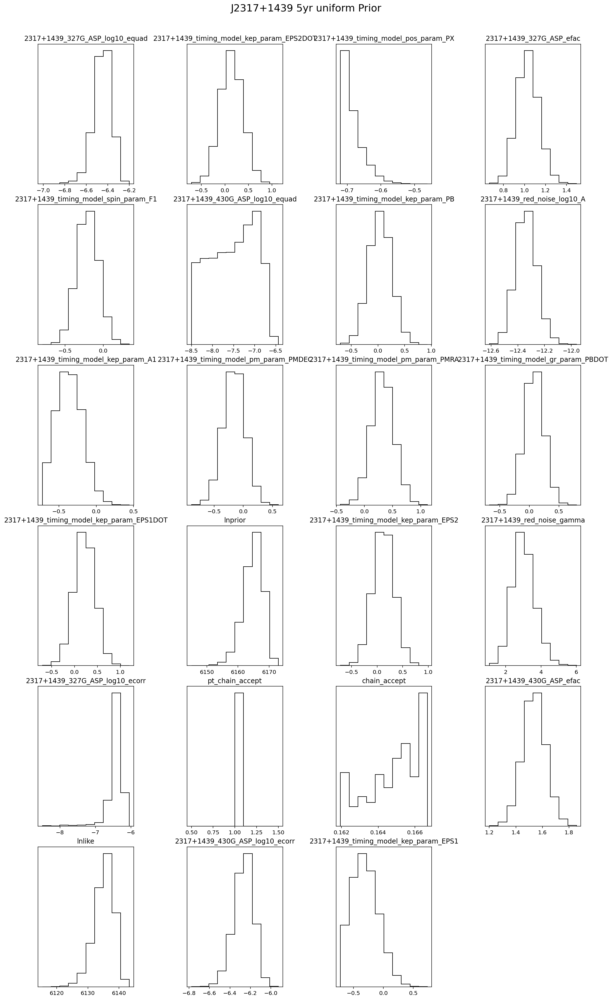

In [82]:
plot_common_chains('5yr','uniform','other')

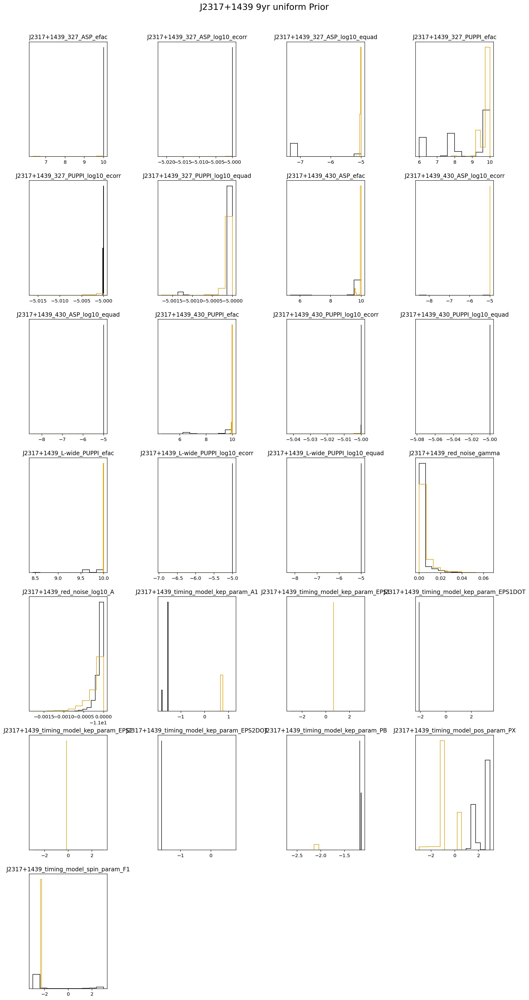

In [106]:
plot_common_chains('9yr','uniform','other')

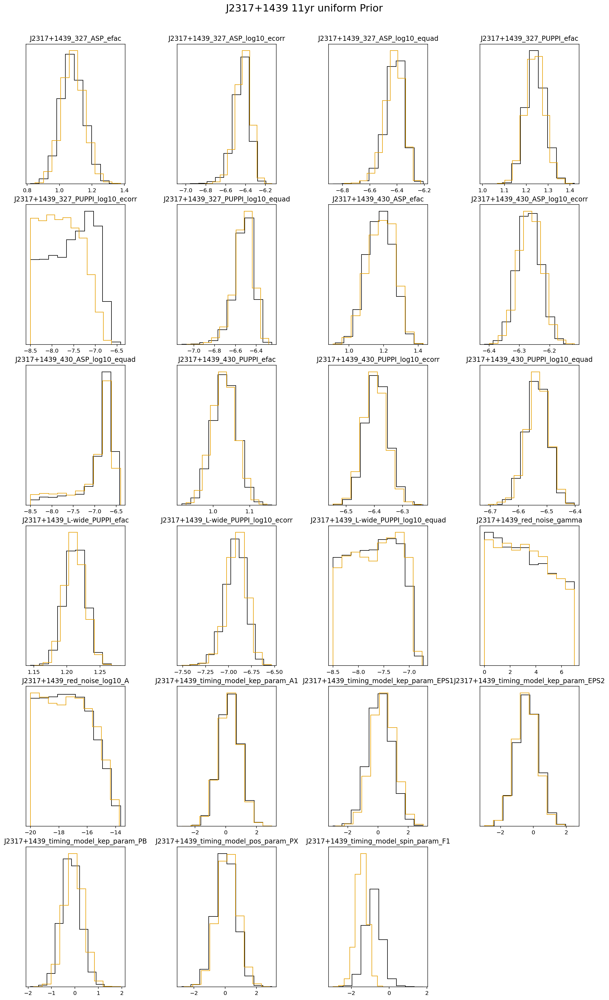

In [107]:
plot_common_chains('11yr','uniform','other')

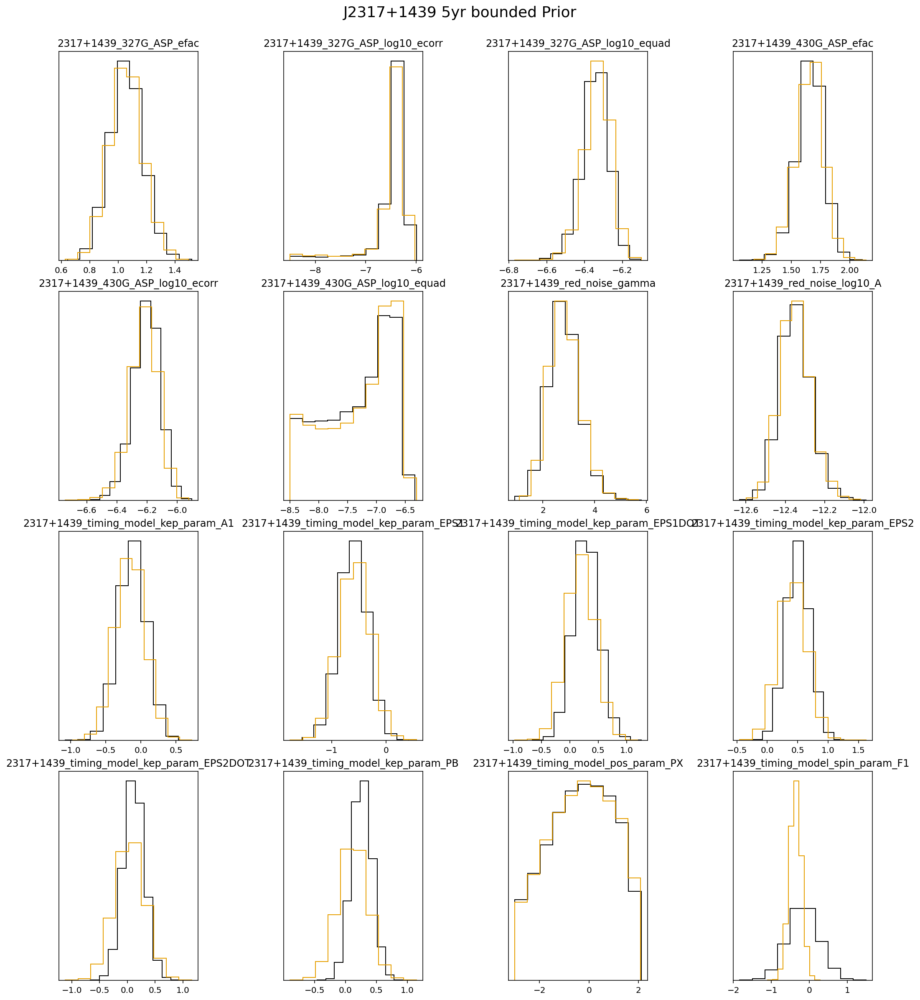

In [108]:
plot_common_chains('5yr','bounded','other')

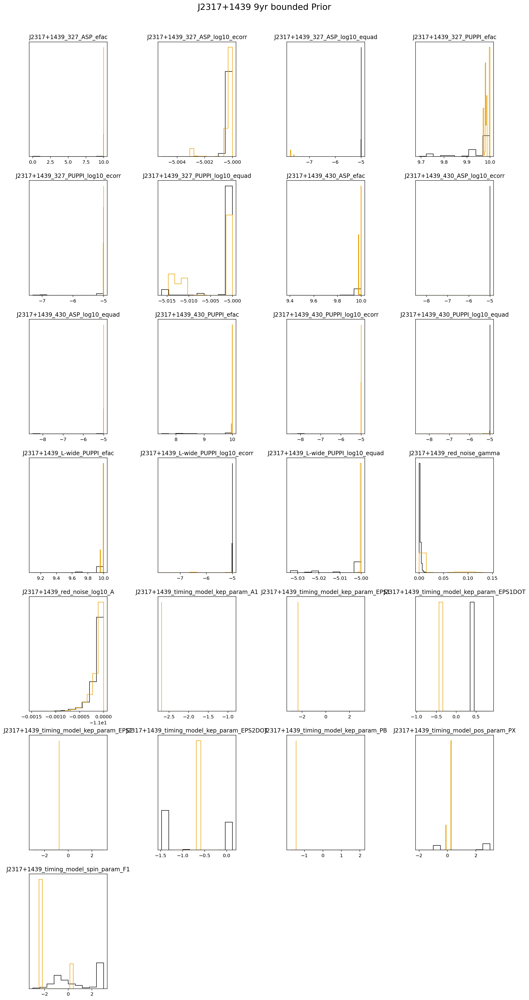

In [109]:
plot_common_chains('9yr','bounded','other')

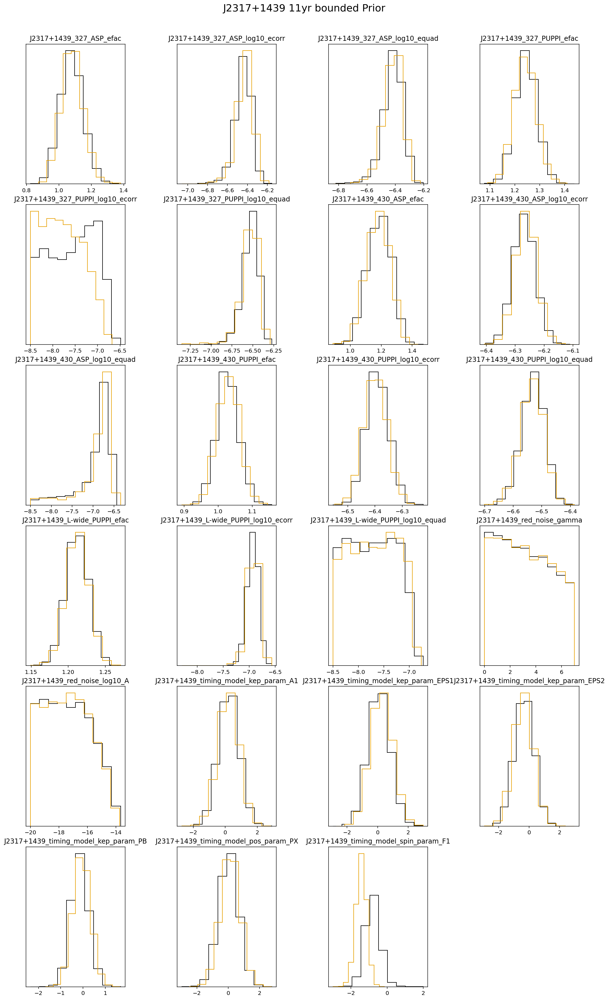

In [110]:
plot_common_chains('11yr','bounded','other')

Making `Arviz` dictionaries to plot all chains

In [16]:
chain_dict = {}
#indices = np.arange(8,16,1)
indices = np.array(range(len(chain_list)))
#indices = indices[int(len(indices)/2):]
for i in indices:
    tmpchain = chain_list[i]
    print(np.shape(tmpchain))
    for j,par in enumerate(tmparam_list[i]):
        if par.split('_')[0] in [psr.name for psr in psrs]: 
            if list(par)[0] != 'J':
                par = 'J' + par
        if par in chain_dict.keys():
            chain_dict[par] = np.concatenate((chain_dict[par],[tmpchain[:,j]]),axis=0)
        else:
            chain_dict[par] = [tmpchain[:,j]]
az_comb = az.convert_to_inference_data(chain_dict)

(149925, 23)
(149925, 23)
(149925, 32)
(149925, 32)
(149925, 30)
(149925, 30)
(149925, 28)
(149925, 28)
(149925, 30)
(149925, 30)
(149925, 21)
(149925, 21)
(149925, 30)
(149925, 30)
(149925, 23)
(149925, 23)
(149925, 32)
(149925, 32)


In [17]:
print(az_comb.posterior)

<xarray.Dataset>
Dimensions:                                    (chain: 18, draw: 149925)
Coordinates:
  * chain                                      (chain) int64 0 1 2 ... 15 16 17
  * draw                                       (draw) int64 0 1 ... 149924
Data variables:
    J2317+1439_327G_ASP_efac                   (chain, draw) float64 1.102 ... nan
    J2317+1439_327G_ASP_log10_ecorr            (chain, draw) float64 -6.352 ... nan
    J2317+1439_327G_ASP_log10_equad            (chain, draw) float64 -6.522 ... nan
    J2317+1439_430G_ASP_efac                   (chain, draw) float64 1.591 ... nan
    J2317+1439_430G_ASP_log10_ecorr            (chain, draw) float64 -6.141 ... nan
    J2317+1439_430G_ASP_log10_equad            (chain, draw) float64 -8.397 ... nan
    J2317+1439_red_noise_gamma                 (chain, draw) float64 4.509 ... 0.003402
    J2317+1439_red_noise_log10_A               (chain, draw) float64 -12.04 ... -11.0
    J2317+1439_timing_model_gr_param_PBDOT     (ch

In [18]:
#az.summary(az_comb)

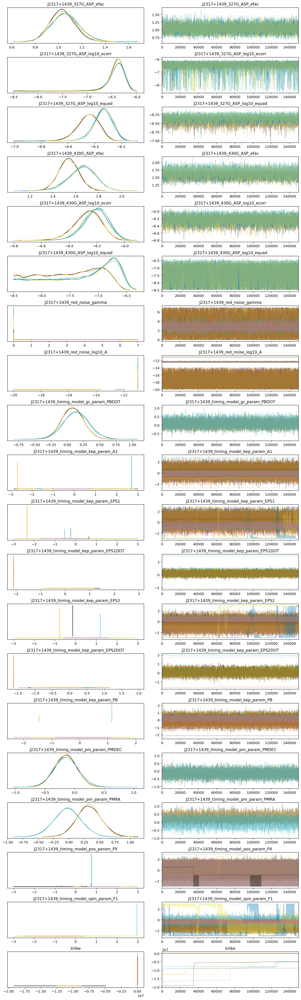

In [19]:
az.plot_trace(az_comb);

Rescaling the timing parameters to their physical values to properly compare datasets

In [94]:
def rescale_pars(chains,tmparams,pardict,dataset,old_dict=None,px_priors=False):
    if not isinstance(chains,np.ndarray):
        chains=np.asarray(chains)
        
    if not isinstance(tmparams,np.ndarray):
        tmparams=np.array(tmparams)
        
    rescaled_chain_dict={}
    for i in range(np.shape(tmparams)[0]):
        for j,par in enumerate(tmparams[i]):
            split_string = par.split('_')
            psr_name = split_string[0]
            if 'timing' in split_string:
                og_par = split_string[-1]
                if px_priors and og_par == 'PX':
                    rescaled_chain = chains[i][:,j]
                else:
                    rescaled_chain = chains[i][:,j]*pardict[dataset][psr_name][og_par]['err']+\
                                        pardict[dataset][psr_name][og_par]['val']
            else:
                if psr_name in ['lnlike','lnprior', 'chain accept', 'pt chain accept']:
                    og_par = par
                    rescaled_chain = chains[i][:,j]
                else:
                    if list(par)[0] != 'J':
                        og_par = 'J' + par
                    else:
                        og_par = par
                rescaled_chain = chains[i][:,j]

            if og_par in rescaled_chain_dict.keys():
                rescaled_chain_dict[og_par] = np.concatenate((rescaled_chain_dict[og_par],[rescaled_chain]),axis=0)
            else:
                rescaled_chain_dict[og_par] = [rescaled_chain]
                
    if old_dict is not None:
        for old_key in old_dict.keys():
            if old_key in rescaled_chain_dict.keys():
                rescaled_chain_dict[old_key] = np.concatenate((rescaled_chain_dict[old_key],old_dict[old_key]),axis=0)
            else:
                rescaled_chain_dict[old_key] = old_dict[old_key]
                
            
    return rescaled_chain_dict

Have to split into datasets for variable WN
Have to separate by number of parameters, then join

In [95]:
dataset_5yr_idx_other = sorted(np.concatenate((chaindir_indices['uniform']['other']['5yr'],
                                               chaindir_indices['bounded']['other']['5yr']),axis=0))
dataset_5yr_idx_px_prior = sorted(np.concatenate((chaindir_indices['uniform']['px_priors']['5yr'],
                                               chaindir_indices['bounded']['px_priors']['5yr']),axis=0))

for i,x in enumerate(dataset_5yr_idx_other):
    if i == 0:
        rescaled_5yr_chain_dict_1 = rescale_pars(np.asarray([chain_list[x]]),[tmparam_list[x]],pardict,'5yr')
    else:
        rescaled_5yr_chain_dict_comb = rescale_pars(np.asarray([chain_list[x]]),
                                                   [tmparam_list[x]],pardict,'5yr',
                                                   old_dict=rescaled_5yr_chain_dict_1)
        rescaled_5yr_chain_dict_1 = rescaled_5yr_chain_dict_comb
        
for i,x in enumerate(dataset_5yr_idx_px_prior):
    rescaled_5yr_chain_dict_comb = rescale_pars(np.asarray([chain_list[x]]),
                                               [tmparam_list[x]],pardict,'5yr',
                                                px_priors=True,
                                               old_dict=rescaled_5yr_chain_dict_1)
    rescaled_5yr_chain_dict_1 = rescaled_5yr_chain_dict_comb
az_comb_5yr_rescaled = az.convert_to_inference_data(rescaled_5yr_chain_dict_comb)

In [96]:
dataset_9yr_idx_other = sorted(np.concatenate((chaindir_indices['uniform']['other']['9yr'],
                                               chaindir_indices['bounded']['other']['9yr']),axis=0))
dataset_9yr_idx_px_prior = sorted(np.concatenate((chaindir_indices['uniform']['px_priors']['9yr'],
                                                  chaindir_indices['bounded']['px_priors']['9yr']),axis=0))

for i,x in enumerate(dataset_9yr_idx_other):
    if i == 0:
        rescaled_9yr_chain_dict_1 = rescale_pars(np.asarray([chain_list[x]]),[tmparam_list[x]],pardict,'9yr')
    else:
        rescaled_9yr_chain_dict_comb = rescale_pars(np.asarray([chain_list[x]]),
                                                   [tmparam_list[x]],pardict,'9yr',
                                                   old_dict=rescaled_9yr_chain_dict_1)
        rescaled_9yr_chain_dict_1 = rescaled_9yr_chain_dict_comb
for i,x in enumerate(dataset_9yr_idx_px_prior):
    rescaled_9yr_chain_dict_comb = rescale_pars(np.asarray([chain_list[x]]),
                                               [tmparam_list[x]],pardict,'9yr',
                                               old_dict=rescaled_9yr_chain_dict_1)
    rescaled_9yr_chain_dict_1 = rescaled_9yr_chain_dict_comb
"""
rescaled_9yr_chain_dict_1 = rescale_pars(np.asarray([chain_list[x] for x in dataset_9yr_idx[:2]]),
                                   [tmparam_list[x] for x in dataset_9yr_idx[:2]],pardict,'9yr')
rescaled_9yr_chain_dict_comb = rescale_pars(np.asarray([chain_list[x] for x in dataset_9yr_idx[-2:]]),
                                   [tmparam_list[x] for x in dataset_9yr_idx[-2:]],pardict,'9yr',
                                        old_dict=rescaled_9yr_chain_dict_1)
"""
az_comb_9yr_rescaled = az.convert_to_inference_data(rescaled_9yr_chain_dict_comb)

In [97]:
dataset_11yr_idx_other = sorted(np.concatenate((chaindir_indices['uniform']['other']['11yr'],
                                                chaindir_indices['bounded']['other']['11yr']),axis=0))
dataset_11yr_idx_px_prior = sorted(np.concatenate((chaindir_indices['uniform']['px_priors']['11yr'],
                                                   chaindir_indices['bounded']['px_priors']['11yr']),axis=0))
for i,x in enumerate(dataset_11yr_idx_other):
    if i == 0:
        rescaled_11yr_chain_dict_1 = rescale_pars(np.asarray([chain_list[x]]),[tmparam_list[x]],pardict,'11yr')
    else:
        rescaled_11yr_chain_dict_comb = rescale_pars(np.asarray([chain_list[x]]),
                                                   [tmparam_list[x]],pardict,'11yr',
                                                   old_dict=rescaled_11yr_chain_dict_1)
        rescaled_11yr_chain_dict_1 = rescaled_11yr_chain_dict_comb
for i,x in enumerate(dataset_11yr_idx_px_prior):
    rescaled_11yr_chain_dict_comb = rescale_pars(np.asarray([chain_list[x]]),
                                               [tmparam_list[x]],pardict,'11yr',
                                               old_dict=rescaled_11yr_chain_dict_1)
    rescaled_11yr_chain_dict_1 = rescaled_11yr_chain_dict_comb
"""
rescaled_11yr_chain_dict_1 = rescale_pars(np.asarray([chain_list[x] for x in dataset_11yr_idx[-2:]]),
                                   [tmparam_list[x] for x in dataset_11yr_idx[-2:]],pardict,'11yr')
rescaled_11yr_chain_dict_comb = rescale_pars(np.asarray([chain_list[x] for x in dataset_11yr_idx[:2]]),
                                   np.asarray([tmparam_list[x] for x in dataset_11yr_idx[:2]]),
                                        pardict,'11yr',old_dict=rescaled_11yr_chain_dict_1)
"""
az_comb_11yr_rescaled = az.convert_to_inference_data(rescaled_11yr_chain_dict_comb)

Combine the common parameters for the not donked up datasets

In [98]:
rescaled_chain_dict_5yr_11yr = {}
for param in rescaled_5yr_chain_dict_comb.keys():
    if param not in ['lnlike','lnprior', 'chain accept', 'pt chain accept']:
        if param in rescaled_11yr_chain_dict_comb.keys():
            rescaled_chain_dict_5yr_11yr[param] = np.concatenate((rescaled_5yr_chain_dict_comb[param],
                                                                  rescaled_11yr_chain_dict_comb[param]),axis=0)

In [99]:
#az.summary(az_comb_5yr_rescaled)

In [100]:
#az.summary(az_comb_9yr_rescaled)

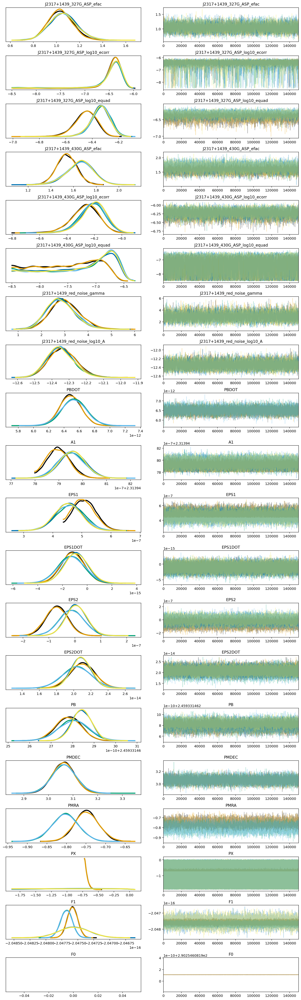

In [102]:
common_pars = []
for param in rescaled_5yr_chain_dict_comb.keys():
    if param not in ['lnlike','lnprior', 'chain accept', 'pt chain accept']:
        common_pars.append(param)
az.plot_trace(az_comb_5yr_rescaled,var_names=common_pars,plot_kwargs={'linewidth':3});

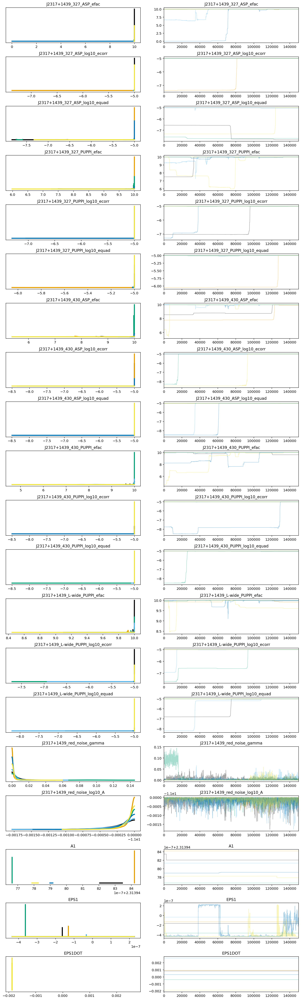

In [103]:
common_pars = []
for param in rescaled_9yr_chain_dict_comb.keys():
    if param not in ['lnlike','lnprior', 'chain accept', 'pt chain accept']:
        common_pars.append(param)
az.plot_trace(az_comb_9yr_rescaled,var_names=common_pars,plot_kwargs={'linewidth':3});

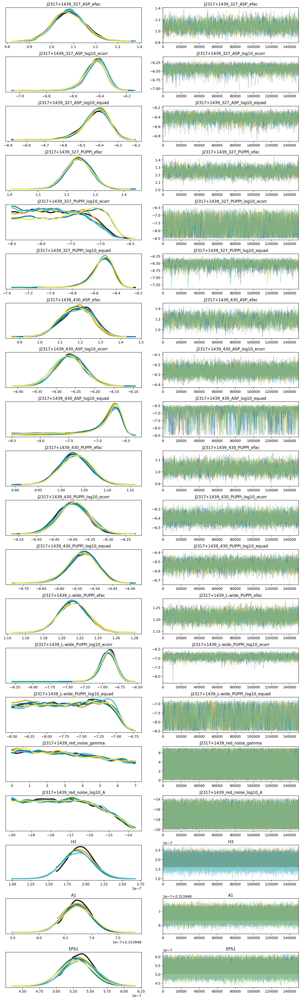

In [104]:
common_pars = []
for param in rescaled_11yr_chain_dict_comb.keys():
    if param not in ['lnlike','lnprior', 'chain accept', 'pt chain accept']:
        common_pars.append(param)
az.plot_trace(az_comb_11yr_rescaled,var_names=common_pars,plot_kwargs={'linewidth':3});

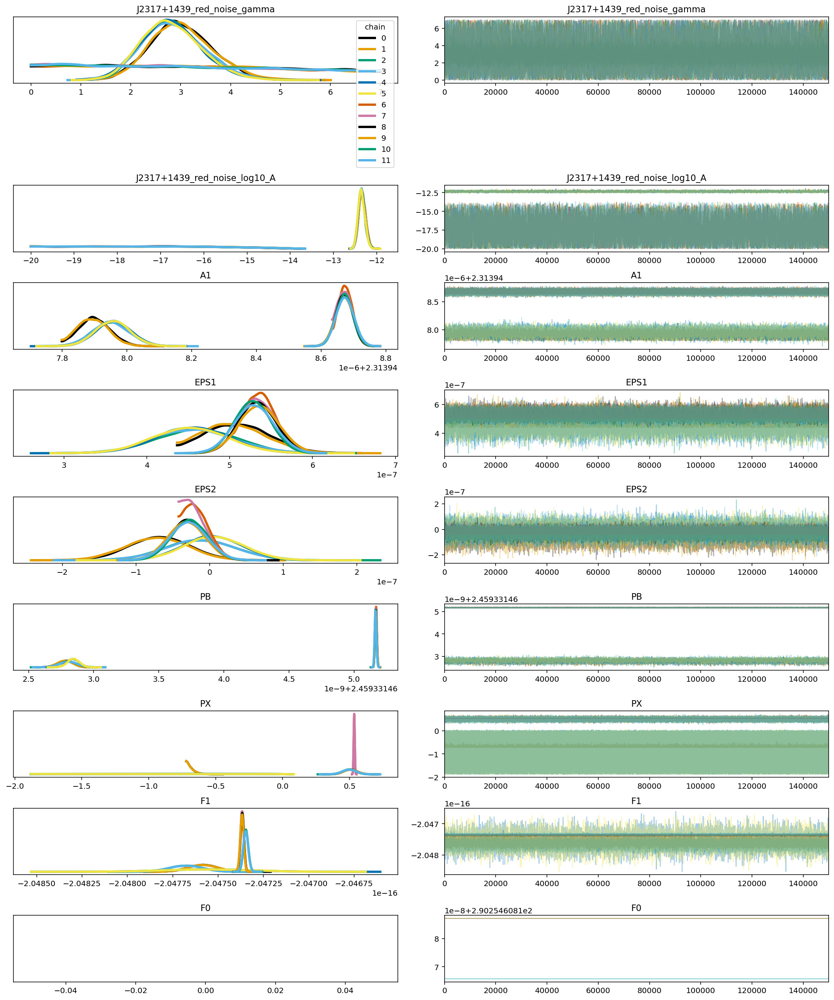

In [105]:
labels = ['5yr,uniform prior','5yr,bounded prior','11yr,uniform prior','5yr,bounded prior']
az.plot_trace(rescaled_chain_dict_5yr_11yr,legend=True,figsize=(15,2*len(rescaled_chain_dict_5yr_11yr.keys())),
             plot_kwargs={'linewidth':3});